# My little playground

Build plots for dash

In [2]:
import sys 
sys.path.append('../')

from utils.dataset import EEGDataset 
from pathlib import Path 
from utils.transforms import Compose
import numpy as np


eeg_dir = Path('../EEGDataset/raw')

- Select a subject
- Normalize data
- Visualize average

In [3]:
data = EEGDataset(eeg_dir, ['sub-01'])
#scaler = data.standard_scaler()
#data.transform = Compose([scaler])

In [4]:
def get_file_index(target, files):
    target = str(target)
    for i, fn in enumerate(files):
        if target == str(fn):
            return i 
    
    return None

In [5]:
eeg_faces = []
eeg_scrambled = []

for d in data:
    if d['label'] == 1:
        eeg_faces.append(d['eeg'])
    else:
        eeg_scrambled.append(d['eeg'])

eeg_faces = np.array(eeg_faces)
eeg_scrambled = np.array(eeg_scrambled)

# Average over trials
avg_faces     = np.mean(eeg_faces, axis=0)
avg_scrambled = np.mean(eeg_scrambled, axis=0)

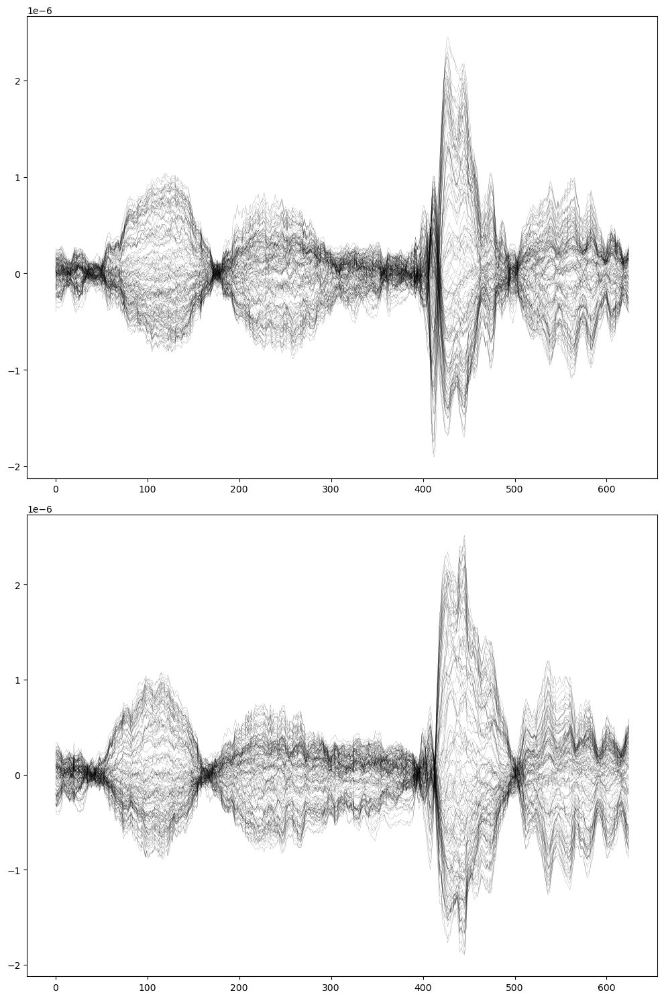

In [6]:
import matplotlib.pyplot as plt 

fig, axs = plt.subplots(2, 1, figsize=(10,15))

axs[0].plot(avg_faces.T, color='black', linewidth=0.1)
axs[0].set_xlabel('')
axs[0].set_ylabel('')

axs[1].plot(avg_scrambled.T, color='black', linewidth=0.1)
axs[1].set_xlabel('')
axs[1].set_ylabel('')

plt.tight_layout()
plt.show()

In [38]:
from scipy import signal 
import plotly.graph_objs as go
from plotly.subplots import make_subplots

faces_concat = np.concatenate(eeg_faces, axis=1)
scram_concat = np.concatenate(eeg_scrambled, axis=1)

sf = 250
win = 4 * sf 
faces_freqs, faces_psd = signal.welch(faces_concat.mean(axis=0), sf, nperseg=win)
scram_freqs, scram_psd = signal.welch(scram_concat.mean(axis=0), sf, nperseg=win)

line  = dict(color='black', width=1)
xaxis = dict(range=[0,50])
yaxis = dict(range=[0, 5.5e-22])

fig = make_subplots(rows=2, cols=1, subplot_titles=['Faces', 'Scrambled'],
                    vertical_spacing=0.4)

fig.add_trace(go.Scatter(x=faces_freqs, y=faces_psd, line=line), row=1, col=1)
fig.add_trace(go.Scatter(x=scram_freqs, y=scram_psd, line=line), row=2, col=1)

fig.update_layout(showlegend=False, xaxis1=xaxis, xaxis2=xaxis, yaxis1=yaxis, yaxis2=yaxis,
                  title_text=f"Welch's periodogram (window = 4 seconds)")

fig.update_xaxes(title_text='Frequency [Hz]')
fig.update_yaxes(title_text='Power spectral density [V²/Hz]', row=2, col=1)

fig.show()

In [39]:
targets = [str(fn) for fn in data.files]
files   = data.files

eeg_faces = []
eeg_scram = []

for t in targets:
    idx = get_file_index(t, files)
    sample = data[idx]

    if sample['label']==1:
        eeg_faces.append(sample['eeg'])
    else:
        eeg_scram.append(sample['eeg'])

    
eeg_faces = np.array(eeg_faces)
eeg_scram = np.array(eeg_scram)


In [51]:
# plot avgs with plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots

line = dict(color='black', width=0.1)

fig = make_subplots(rows=2, cols=1)

for row in avg_faces:
    fig.add_trace(go.Scatter(y=row, line=line), row=1, col=1)

traces_scram = []
for row in avg_scrambled:
    fig.add_trace(go.Scatter(y=row, line=line), row=2, col=1)

fig.update_layout(showlegend=False)

fig.show()

In [60]:
# plot time average
import plotly.figure_factory as ff

avg_faces = np.mean(eeg_faces, axis=2).flatten()
avg_scram = np.mean(eeg_scrambled, axis=2).flatten()

hist_data = [avg_faces, avg_scram]
group_labels = ['faces', 'scrambled']

fig = ff.create_distplot(hist_data, group_labels, bin_size=1e-9, show_rug=False)
fig.show()

In [28]:
from scipy import stats
import plotly.figure_factory as ff

skew_faces = np.sum(np.abs(np.diff(eeg_faces, axis=-1)), axis=-1).flatten()
skew_scram = np.sum(np.abs(np.diff(eeg_scrambled, axis=-1)), axis=-1).flatten()

hist_data = [skew_faces, skew_scram]
group_labels = ['faces', 'scrambled']

fig = ff.create_distplot(hist_data, group_labels, bin_size=1e-5, show_rug=False)

range = [
        min(np.min(skew_faces), np.min(skew_scram)),
        max(np.max(skew_faces), np.max(skew_scram)),
    ]
    
fig.update_layout(xaxis=dict(range=range))

fig.show()

In [5]:
from utils.readers import read_epochs 

bids_dir = Path('/home/admin/work/data/ds003505-download/')
subject = 'sub-01' 
task = 'faces' 

sample = read_epochs(bids_dir, subject, task)
sample.info

Extracting parameters from /home/admin/work/data/ds003505-download/derivatives/eeglab-v14.1.1/sub-01/eeg/sub-01_task-faces_desc-preproc_eeg.set...


/home/admin/work/NetworkMachineLearning_2023/NotebooksNino/../utils/readers.py:267: RuntimeWarning: At least one epoch has multiple events. Only the latency of the first event will be retained.
  eeg = mne.io.read_epochs_eeglab(fileName)


Not setting metadata
588 matching events found
No baseline correction applied
0 projection items activated
Ready.


<Info | 8 non-empty values
 bads: []
 ch_names: A1, A2, A3, A4, A5, A6, A7, A8, A9, A10, A11, A12, A13, A14, ...
 chs: 128 EEG
 custom_ref_applied: False
 dig: 128 items (128 EEG)
 highpass: 0.0 Hz
 lowpass: 125.0 Hz
 meas_date: unspecified
 nchan: 128
 projs: []
 sfreq: 250.0 Hz
>